# R1 — DoorKey relational map-size transfer

D1/D3 的九个谓词里，`t_ahead/t_left/t_right/t_reach` 是 oracle 先选好一个"当前目标"（没钥匙→key，没开门→door，否则→goal）再统一给的相对方向。R1 把这个"先选目标"的步骤去掉，换成 19 个**各自独立**的物体关系：key/door/goal 三个物体各自的 ahead/left/right/reach，外加 4 个状态谓词和 3 个拓扑/杂项谓词。策略要自己决定"现在该看哪个物体"。

这个 checkpoint **只在 6×6 训练过**（`train_seed=0`），本 notebook 把同一个 checkpoint 原样搬到 8×8、16×16 上跑，不做任何微调——这是论文的跨尺寸迁移压力测试，结论是负面的。

本 notebook 包含四段真实闭环动画（同一个 checkpoint，19 个原子是模型自己算出来喂给 actor 的真符号瓶颈，不是事后 probe）：

1. 6×6（训练分布内）走迷宫 + 同步 belief 面板。
2. 8×8（部分迁移）同上。
3. 16×16（完全失败）同上。
4. 16×16 对照：同一张地图，学到的策略 vs. 只读同一套 19 谓词真值的 scripted 规则控制器——用来说明词表本身够用，是"学到的链条"没能跨尺寸迁移，不是词表不够。

边界：`results/relational_stress_test/summary.json` 里的 hard-oracle 数字来自一个已被删除的探索性 notebook，本 notebook 只能原样引用，无法现场复现；本 notebook 也不重新训练，不对跨尺寸鲁棒性做任何超出已测尺寸的推断。

In [1]:
import json, pathlib, sys, warnings
warnings.filterwarnings("ignore")
import numpy as np
import torch
import matplotlib
matplotlib.rcParams["font.sans-serif"] = ["Microsoft YaHei", "SimHei", "DengXian"]
matplotlib.rcParams["axes.unicode_minus"] = False
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML, display

HERE = pathlib.Path.cwd()
REPO = HERE if (HERE / "dreamer.py").exists() else HERE.parent
sys.path[:0] = [str(REPO), str(REPO / "scripts")]

CKPT = REPO / "models/doorkey/relational_stress_test/checkpoint_050000.pt"
SUMMARY_PATH = REPO / "results/relational_stress_test/summary.json"
DEVICE = "cuda:0" if torch.cuda.is_available() else "cpu"
assert CKPT.exists(), CKPT
summary = json.loads(SUMMARY_PATH.read_text(encoding="utf-8"))
print("device:", DEVICE)
print("checkpoint:", CKPT.relative_to(REPO))
print("claim boundary (from summary.json):", summary["claim_boundary"])

import ablate_sym as A
import envs.minigrid as M
from doorkey_relational_scripted import scripted

agent, config = A.load(str(CKPT), DEVICE, ["defaults", "minigrid", "minigrid_symbolic_nav_rel"])
wm, behavior = agent._wm, agent._task_behavior
LABELS = list(wm._sym_head.labels)
K = wm.sym_dim
actor_in_dim = behavior.actor.layers[0].in_features

print(f"\n参数量: {sum(p.numel() for p in agent.parameters()):,}")
print(f"symbolic head: feat1280 -> {K} atoms, policy_input={wm._sym_policy_input}")
print(f"actor 输入维度: {actor_in_dim}  (= {K} 个具名原子，连续 1280 维 feat 已被切断——和 D3 一样是真瓶颈)")
print(f"具名原子（{K}）: {LABELS}")
print(f"time_limit (每局最大步数): {config.time_limit}")

# 19 个谓词的语义分组：4 个状态 + 3 个拓扑/杂项 + 3 个物体 x 4 个方向关系
STATE_LABELS = ["has_key", "door_locked", "door_open", "carrying"]
TOPO_LABELS = ["door_between_agent_goal", "agent_on_door", "wall_ahead"]
REL_OBJECTS = ["key", "door", "goal"]
REL_DIRS = ["ahead", "left", "right", "reach"]
assert set(STATE_LABELS + TOPO_LABELS + [f"{o}_{d}" for o in REL_OBJECTS for d in REL_DIRS]) == set(LABELS)

ACTION_NAMES = ["left", "right", "forward", "pickup", "toggle"]
MAX_ANIM_FRAMES = 80   # 动画只渲染前 80 帧控制文件体积；success/steps 统计用完整 rollout，不受此截断影响
N_EVAL = 20             # 每个尺寸的现场复现批量局数

device: cuda:0
checkpoint: models\doorkey\relational_stress_test\checkpoint_050000.pt
claim boundary (from summary.json): Negative map-size transfer stress test. The vocabulary is control-sufficient, but the learned chain does not transfer robustly.


Gym has been unmaintained since 2022 and does not support NumPy 2.0 amongst other critical functionality.
Please upgrade to Gymnasium, the maintained drop-in replacement of Gym, or contact the authors of your software and request that they upgrade.
See the migration guide at https://gymnasium.farama.org/introduction/migration_guide/ for additional information.


Encoder CNN shapes: {}
Encoder MLP shapes: {'grid': (148,)}
Decoder CNN shapes: {}
Decoder MLP shapes: {'grid': (148,)}


Symbolic belief head enabled: feat1280->19 atoms labels=['has_key', 'door_locked', 'door_open', 'carrying', 'door_between_agent_goal', 'agent_on_door', 'wall_ahead', 'key_ahead', 'key_left', 'key_right', 'key_reach', 'door_ahead', 'door_left', 'door_right', 'door_reach', 'goal_ahead', 'goal_left', 'goal_right', 'goal_reach'] n_lit=48 mask=none loss=mse scale=2.0 (atoms shape WM AND feed policy)


Optimizer model_opt has 12519144 variables.
Optimizer actor_opt has 72709 variables.
Optimizer value_opt has 136959 variables.

参数量: 12,865,771
symbolic head: feat1280 -> 19 atoms, policy_input=atoms
actor 输入维度: 19  (= 19 个具名原子，连续 1280 维 feat 已被切断——和 D3 一样是真瓶颈)
具名原子（19）: ['has_key', 'door_locked', 'door_open', 'carrying', 'door_between_agent_goal', 'agent_on_door', 'wall_ahead', 'key_ahead', 'key_left', 'key_right', 'key_reach', 'door_ahead', 'door_left', 'door_right', 'door_reach', 'goal_ahead', 'goal_left', 'goal_right', 'goal_reach']
time_limit (每局最大步数): 300


## 词表：19 个独立关系谓词

不再像 D1/D3 那样摊平成一竖列——19 项太长不好扫视。下面所有 belief 面板统一按语义分两块画：

- **状态 / 拓扑（7 项）**：`has_key, door_locked, door_open, carrying, door_between_agent_goal, agent_on_door, wall_ahead`
- **方向关系（12 项，3 物体 × 4 方向的表格）**：行 = key / door / goal，列 = ahead / left / right / reach

这个分组直接对应词表的构造方式（关系 × 物体），比逐行罗列 19 个名字更容易一眼看出"模型现在关注哪个物体、判断它在哪个方向"。

size              autonomous(frozen)   hard-oracle(frozen)   scripted-rule(frozen)
doorkey6x6_rel       81/100              32/40                100/100
doorkey8x8_rel       23/100              28/40                100/100
doorkey16x16_rel      0/100              14/40                100/100

现场复现（N_EVAL=20 局，seed 0..19，同一 checkpoint，未重新训练）：


doorkey6x6_rel   live success 0.90 (18/20)  mean ep-len 47.6  mean atom acc 0.971  (最差谓词 door_ahead=0.829)


doorkey8x8_rel   live success 0.15 (3/20)  mean ep-len 261.9  mean atom acc 0.836  (最差谓词 door_open=0.342)


doorkey16x16_rel live success 0.00 (0/20)  mean ep-len 300.0  mean atom acc 0.847  (最差谓词 door_open=0.663)


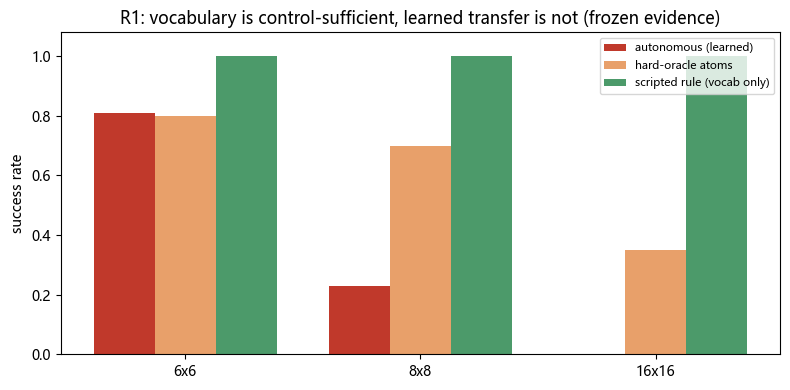

In [2]:
# 冻结证据（论文数字，原样引用，不现场复现）+ 现场复现：同一 checkpoint 在三种尺寸上重新跑 N_EVAL 局，
# 顺带测一下 19 个原子相对 god_state 真值的准确率——用来诊断失败到底出在"看错了"还是"看对了但不会用"。
SIZES = ["doorkey6x6_rel", "doorkey8x8_rel", "doorkey16x16_rel"]
SIZE_KEYS = ["doorkey_6x6", "doorkey_8x8", "doorkey_16x16"]

print(f"{'size':<16}{'autonomous(frozen)':>20}{'hard-oracle(frozen)':>22}{'scripted-rule(frozen)':>24}")
for size, key in zip(SIZES, SIZE_KEYS):
    auto = summary["autonomous_success"][key]
    oracle = summary["hard_oracle_atom_upper_bound"][key]
    rule = summary["scripted_rule_controller"][key]
    print(f"{size:<16}{auto['successes']:>7}/{auto['episodes']:<12}"
          f"{oracle['successes']:>7}/{oracle['episodes']:<14}"
          f"{rule['successes']:>7}/{rule['episodes']}")

print(f"\n现场复现（N_EVAL={N_EVAL} 局，seed 0..{N_EVAL-1}，同一 checkpoint，未重新训练）：")
live_eval = {}
for size in SIZES:
    r = A.run_eps(agent, config, size, N_EVAL, ablate=None, seed0=0)
    live_eval[size] = r
    mean_atom_acc = float(np.mean(list(r["atom_acc"].values())))
    worst_lab = min(r["atom_acc"], key=r["atom_acc"].get)
    print(f"{size:<16} live success {r['success']:.2f} ({int(round(r['success']*N_EVAL))}/{N_EVAL})  "
          f"mean ep-len {r['len']:.1f}  mean atom acc {mean_atom_acc:.3f}  "
          f"(最差谓词 {worst_lab}={r['atom_acc'][worst_lab]:.3f})")

# 三组条件 x 三种尺寸的对比图（冻结数字）
fig, ax = plt.subplots(figsize=(8, 4))
x = np.arange(len(SIZES)); w = 0.26
def rate(cond, key): return summary[cond][key]["successes"] / summary[cond][key]["episodes"]
ax.bar(x - w, [rate("autonomous_success", k) for k in SIZE_KEYS], w, label="autonomous (learned)", color="#c0392b")
ax.bar(x,     [rate("hard_oracle_atom_upper_bound", k) for k in SIZE_KEYS], w, label="hard-oracle atoms", color="#e8a06a")
ax.bar(x + w, [rate("scripted_rule_controller", k) for k in SIZE_KEYS], w, label="scripted rule (vocab only)", color="#4c9a6a")
ax.set_xticks(x); ax.set_xticklabels(["6x6", "8x8", "16x16"])
ax.set_ylim(0, 1.08); ax.set_ylabel("success rate")
ax.set_title("R1: vocabulary is control-sufficient, learned transfer is not (frozen evidence)")
ax.legend(fontsize=8)
plt.tight_layout(); plt.show()

## 走迷宫 + 蒸馏 belief 同步动画（按地图尺寸分节）

左边走迷宫画面，右边同步显示这一步的 19 个原子（模型自己算的，直接喂给 actor，不是事后 probe），按上面的分组画：上半区状态/拓扑逐条列，下半区 key/door/goal × ahead/left/right/reach 的表格。动画只截断显示前 80 帧控制文件大小，真实 success/steps 统计用完整 rollout。

In [3]:
@torch.no_grad()
def rollout_learned(task, seed, max_frames=MAX_ANIM_FRAMES):
    """真实闭环：模型自己的 encoder/RSSM/sym_head/actor，19 个原子是 wm._sym_head.atoms(feat) 算出来的真值。"""
    tl = config.time_limit
    env = A.make_env(task, seed, tl)
    obs = env.reset(); latent = action = None
    frames, belief_seq, acts = [], [], []
    success, t = False, 0
    for t in range(tl + 1):
        ob = {k: np.array(v)[None] for k, v in obs.items() if not k.startswith("log_")}
        data = wm.preprocess(ob); embed = wm.encoder(data)
        latent, _ = wm.dynamics.obs_step(latent, action, embed, data["is_first"], sample=False)
        feat = wm.dynamics.get_feat(latent)
        atoms = wm._sym_head.atoms(feat)
        pol = wm.augment(feat)
        action = behavior.actor(pol).mode()
        a = int(torch.argmax(action, -1)[0].item())
        if len(frames) < max_frames:
            frames.append(env.render())
            belief_seq.append({lab: bool(atoms[0, i].item() > 0) for i, lab in enumerate(LABELS)})
            acts.append(a)
        obs, r, done, _ = env.step(a)
        if done:
            success = bool(r > 0); break
    if len(frames) < max_frames:
        frames.append(env.render())
        belief_seq.append(belief_seq[-1] if belief_seq else {})
    env.close()
    return dict(frames=frames, belief=belief_seq, acts=acts, success=success, steps=t + 1, source="model atoms")


def rollout_scripted(task, seed, max_frames=MAX_ANIM_FRAMES):
    """对照：不经过模型，scripted() 直接读 env.god_state() 真值决策——用来检验词表本身够不够用。"""
    tl = config.time_limit
    env = M.MiniGrid(task, mode="eval", seed=seed, max_steps=tl)
    env.reset()
    frames, belief_seq, acts = [], [], []
    success, t = False, 0
    for t in range(tl):
        g = env.god_state()
        a = scripted(g)
        if len(frames) < max_frames:
            frames.append(env.render())
            belief_seq.append({lab: bool(g[lab]) for lab in LABELS})
            acts.append(a)
        _, r, done, _ = env.step(a)
        if done:
            success = bool(r > 0); break
    if len(frames) < max_frames:
        frames.append(env.render())
        belief_seq.append(belief_seq[-1] if belief_seq else {})
    env.close()
    return dict(frames=frames, belief=belief_seq, acts=acts, success=success, steps=t + 1, source="ground-truth god_state")


def draw_belief_panel(ax, values, subtitle):
    """values: {label: bool}. 上半区状态/拓扑逐条列，下半区 3 物体 x 4 方向表格。"""
    ax.clear(); ax.axis("off")
    ax.text(0.0, 1.0, subtitle, fontsize=10, weight="bold", transform=ax.transAxes, va="top")
    y = 0.90
    for lab in STATE_LABELS + TOPO_LABELS:
        active = values.get(lab, False)
        color = "#2e7d32" if active else "#999999"
        ax.text(0.02, y, f"{'●' if active else '○'} {lab}", fontsize=8.8, color=color, transform=ax.transAxes)
        y -= 0.078
    y -= 0.03
    col_x = [0.34, 0.54, 0.74, 0.94]
    for cx, d in zip(col_x, REL_DIRS):
        ax.text(cx, y, d, fontsize=8, color="#888", transform=ax.transAxes, ha="center")
    y -= 0.075
    for obj in REL_OBJECTS:
        ax.text(0.02, y, obj, fontsize=9, weight="bold", transform=ax.transAxes)
        for cx, d in zip(col_x, REL_DIRS):
            active = values.get(f"{obj}_{d}", False)
            color = "#2e7d32" if active else "#999999"
            ax.text(cx, y, "●" if active else "○", fontsize=11, color=color, transform=ax.transAxes, ha="center")
        y -= 0.09
    ax.set_xlim(0, 1); ax.set_ylim(0, 1)


def show_two_panel(run, title, subtitle):
    fig, (axL, axR) = plt.subplots(1, 2, figsize=(10.5, 4.8))
    imL = axL.imshow(run["frames"][0]); axL.axis("off")
    axR.axis("off")

    def upd(i):
        fr = run["frames"][min(i, len(run["frames"]) - 1)]
        imL.set_data(fr)
        a_idx = run["acts"][i] if i < len(run["acts"]) else None
        axL.set_title(f"{title}\nstep {i}  action={ACTION_NAMES[a_idx] if a_idx is not None else 'terminal'}")
        draw_belief_panel(axR, run["belief"][min(i, len(run["belief"]) - 1)], subtitle)
        return imL,

    anim = animation.FuncAnimation(fig, upd, frames=len(run["frames"]), interval=380, blit=False)
    html = HTML(anim.to_jshtml())
    plt.close(fig)
    return html

### A. 6×6 — 训练分布内

In [4]:
demo_6x6 = rollout_learned("doorkey6x6_rel", seed=0)
print(f"seed=0 | 训练尺寸 | success={demo_6x6['success']}  steps={demo_6x6['steps']}")
display(show_two_panel(demo_6x6, "6x6 (in-distribution)", "模型 atoms（阈值化，直接喂 actor）"))

seed=0 | 训练尺寸 | success=True  steps=16


### B. 8×8 — 部分迁移

In [5]:
demo_8x8 = rollout_learned("doorkey8x8_rel", seed=0)
print(f"seed=0 未做 cherry-pick，如实展示 | success={demo_8x8['success']}  steps={demo_8x8['steps']}")
display(show_two_panel(demo_8x8, "8x8 (map-size transfer)", "模型 atoms（阈值化，直接喂 actor）"))

seed=0 未做 cherry-pick，如实展示 | success=False  steps=300


### C. 16×16 — 完全失败

In [6]:
demo_16x16 = rollout_learned("doorkey16x16_rel", seed=0)
print(f"seed=0 | success={demo_16x16['success']}  steps={demo_16x16['steps']}"
      f"（frozen 证据是 0/100，这里 1 局同样预期失败/超时，动画只截断显示前 {MAX_ANIM_FRAMES} 步）")
display(show_two_panel(demo_16x16, "16x16 (map-size transfer)", "模型 atoms（阈值化，直接喂 actor）"))

seed=0 | success=False  steps=300（frozen 证据是 0/100，这里 1 局同样预期失败/超时，动画只截断显示前 80 步）


## D. 16×16 对照：学到的策略 vs. scripted 规则控制器

同一张地图（seed=0，复用上面 section C 的 `demo_16x16`），同一套 19 个谓词。上排是学到的策略（belief 面板读的是模型自己算的原子）；下排是 `doorkey_relational_scripted.py` 里的反应式规则控制器，直接读 `env.god_state()` 真值，完全不经过模型。如果下排能走通而上排走不通，说明词表本身对这张地图是控制充分的，问题出在学到的策略链条，不是词表不够表达。

In [7]:
scripted_16x16 = rollout_scripted("doorkey16x16_rel", seed=0)
print(f"scripted controller | seed=0 | success={scripted_16x16['success']}  steps={scripted_16x16['steps']}")
print(f"学到的策略（复用 section C）| seed=0 | success={demo_16x16['success']}  steps={demo_16x16['steps']}")

n_frames = max(len(demo_16x16["frames"]), len(scripted_16x16["frames"]))
fig, ((axLT, axRT), (axLB, axRB)) = plt.subplots(2, 2, figsize=(10.5, 9.2))
imLT = axLT.imshow(demo_16x16["frames"][0]); axLT.axis("off")
imLB = axLB.imshow(scripted_16x16["frames"][0]); axLB.axis("off")
axRT.axis("off"); axRB.axis("off")

def upd_cmp(i):
    fr_t = demo_16x16["frames"][min(i, len(demo_16x16["frames"]) - 1)]
    fr_b = scripted_16x16["frames"][min(i, len(scripted_16x16["frames"]) - 1)]
    imLT.set_data(fr_t); imLB.set_data(fr_b)
    a_t = demo_16x16["acts"][i] if i < len(demo_16x16["acts"]) else None
    a_b = scripted_16x16["acts"][i] if i < len(scripted_16x16["acts"]) else None
    axLT.set_title(f"学到的策略 | step {i}  action={ACTION_NAMES[a_t] if a_t is not None else 'held'}")
    axLB.set_title(f"scripted 规则控制器 | step {i}  action={ACTION_NAMES[a_b] if a_b is not None else 'held'}")
    draw_belief_panel(axRT, demo_16x16["belief"][min(i, len(demo_16x16["belief"]) - 1)], "模型 atoms（阈值化，喂给 actor）")
    draw_belief_panel(axRB, scripted_16x16["belief"][min(i, len(scripted_16x16["belief"]) - 1)], "环境真值 god_state（不经过模型）")
    return imLT, imLB

anim_cmp = animation.FuncAnimation(fig, upd_cmp, frames=n_frames, interval=380, blit=False)
plt.tight_layout()
html_cmp = HTML(anim_cmp.to_jshtml())
plt.close(fig)
html_cmp

scripted controller | seed=0 | success=True  steps=32
学到的策略（复用 section C）| seed=0 | success=False  steps=300


## 结论

- 词表控制充分：scripted 规则控制器在三种尺寸的 frozen 证据都是 100/100，section D 的 16×16 现场对照同样验证了这一点——同一张地图，只读同一套 19 个谓词真值就能走通。
- 学到的策略不能跨尺寸迁移：6×6→8×8→16×16 上 autonomous success 从 81/100 塌到 23/100 再到 0/100；section A-C 三段动画和现场复现的 live success 与这个趋势一致。
- 现场复现同时给出了 19 个原子相对 god_state 的准确率（见数值总览 cell），可用来判断失败更接近"看错了"还是"看对了但policy不会用"——具体数字以本次跑出来的为准。
- 边界：checkpoint 只在 6×6 训练过，本 notebook 不重新训练、不调参；hard-oracle 数字来自已删除脚本的冻结摘要，本 notebook 只引用不复现；R1 是尺寸迁移压力测试，不是 D1/D3 那种同尺寸内的谓词可解码性或因果依赖结论。